## PROBLEM 1: Topic Models

In [1]:
import re
import gensim
import numpy as np
from gensim import corpora, models
from sklearn.datasets import fetch_20newsgroups

import nltk
from nltk.corpus import stopwords

In [2]:
newsgroups = fetch_20newsgroups(subset='all', remove=('headers', 'footers', 'quotes'))
texts = newsgroups.data  
labels = newsgroups.target  
label_names = newsgroups.target_names

In [3]:
###nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
def preprocess_text(text):
    # Remove non-letter characters, lowercase, and split into tokens.
    text = re.sub(r'[^a-zA-Z.]', ' ', text) #keep letters and periods
    tokens = text.lower().split()
    tokens = [token.strip() for token in tokens if token not in stop_words and len(token) > 2]
    return tokens

processed_doc_20ng = [preprocess_text(doc) for doc in texts] # tokenized words
# Create a dictionary and corpus for gensim LDA
dictionary_20ng = corpora.Dictionary(processed_doc_20ng) #word id mapping
corpus_20ng = [dictionary_20ng.doc2bow(text) for text in processed_doc_20ng] # Convert document into the bag-of-words (list of (token_id, token_count) tuples).

In [5]:
corpus_20ng[0]

[(0, 1),
 (1, 1),
 (2, 1),
 (3, 1),
 (4, 1),
 (5, 1),
 (6, 3),
 (7, 1),
 (8, 1),
 (9, 1),
 (10, 1),
 (11, 1),
 (12, 1),
 (13, 1),
 (14, 1),
 (15, 1),
 (16, 2),
 (17, 1),
 (18, 1),
 (19, 2),
 (20, 1),
 (21, 1),
 (22, 2),
 (23, 1),
 (24, 1),
 (25, 1),
 (26, 1),
 (27, 1),
 (28, 1),
 (29, 2),
 (30, 1),
 (31, 1),
 (32, 1),
 (33, 1),
 (34, 1),
 (35, 4),
 (36, 1),
 (37, 1),
 (38, 1),
 (39, 1),
 (40, 1),
 (41, 1),
 (42, 1),
 (43, 1),
 (44, 1),
 (45, 1),
 (46, 2),
 (47, 1),
 (48, 1),
 (49, 1),
 (50, 2),
 (51, 1),
 (52, 1),
 (53, 1),
 (54, 1),
 (55, 1),
 (56, 1),
 (57, 1),
 (58, 1)]

In [4]:
tfidf_model_20ng = models.TfidfModel(corpus_20ng)
tfidf_corpus_20ng = tfidf_model_20ng[corpus_20ng] # equivelent to  [tfidf_model[doc] for doc in corpus]

In [5]:
#Load DUC dataset
import os
def parse_duc_data():

    duc_dict = {}
    path = os.listdir("./Datasets/DUC2001")
    for file in path:
        if file.endswith(".txt") and "_system" not in file: #remove malformed file 'ap900322-0200_system.txt'
            fid = file.replace(".txt", "")
            with open(os.path.join("./Datasets/DUC2001", file), 'r', encoding='utf-8') as f:
                document = f.read().strip()
                pattern = r"Abstract:\s*(.*?)\s*Introduction:\s*(.*)"
                match = re.search(pattern, document, re.DOTALL )
                if match:
                    abstract = match.group(1).strip()
                    introduction = match.group(2).strip()
                    duc_dict[fid] = {
                        "Abstract": abstract,
                        "Introduction": introduction
                    }
                else:
                    duc_dict[fid] = {
                        "Abstract": None,
                        "Introduction": None
                    }
    return duc_dict

In [6]:
duc_dict = parse_duc_data()

In [7]:
intros = [preprocess_text(doc['Introduction']) for doc in duc_dict.values()]
duc_intro_dictionary = corpora.Dictionary(intros) 
duc_intro_corpus = [duc_intro_dictionary.doc2bow(doc) for doc in intros]
duc_intro_tfidf_model = models.TfidfModel(duc_intro_corpus)
duc_intro_tfidf_corpus = duc_intro_tfidf_model[duc_intro_corpus]

In [8]:
def lda_topics(corpus,dictionary,num_topics, passes=5):
    """
    Train an LDA model using gensim and print top 20 words with probabilities for each topic.
    """
    lda_model = models.LdaModel(
        corpus=corpus,
        id2word=dictionary,
        num_topics=num_topics,
        passes=passes,
        random_state=17
    )
    topics = lda_model.show_topics(num_topics=num_topics, num_words=20, formatted=False)
    print(f"\n=== LDA Topics (K={num_topics}) ===")
    for topic_id, word_probs in topics:
        print(f"Topic {topic_id}:")
        for word, prob in word_probs:
            print(f"  {word}: {prob:.4f}", end="  ")
        print("\n")
    return lda_model

def nmf_topics(corpus,dictionary,num_topics):
    """
    Train an NMF model using gensim and print the top 20 words with normalized weights for each topic.
    """
    nmf_model = models.Nmf(
        corpus=corpus,
        num_topics=num_topics,
        id2word=dictionary,
        random_state=17
    )
    topics = nmf_model.show_topics(num_topics=num_topics, num_words=20, formatted=False)
    print(f"\n=== NMF Topics (K={num_topics}) ===")
    for topic_id, word_weights in topics:
        print(f"Topic {topic_id}:")
        # Normalize weights so they sum to 1
        weight_sum = sum([w for _, w in word_weights])
        for word, weight in word_weights:
            norm_weight = weight / weight_sum if weight_sum > 0 else 0
            print(f"{word}: {norm_weight:.4f}", end="  ")
        print("\n")
    return nmf_model

In [9]:
lda_models = []
for k in [ 20, 50]:
    lda_models.append(lda_topics(corpus_20ng,dictionary_20ng,num_topics=k))


=== LDA Topics (K=20) ===
Topic 0:
  key: 0.0111    one: 0.0077    gun: 0.0068    said: 0.0065    government: 0.0060    law: 0.0055    fbi: 0.0055    encryption: 0.0054    would: 0.0054    people: 0.0052    two: 0.0047    fire: 0.0046    chip: 0.0045    keys: 0.0042    use: 0.0042    went: 0.0041    clipper: 0.0041    could: 0.0040    koresh: 0.0035    police: 0.0035  

Topic 1:
  cipher: 0.0095    cover: 0.0087    man: 0.0087    new: 0.0082    art: 0.0075    istanbul: 0.0066    ed.: 0.0062    comics: 0.0059    appears: 0.0059    wolverine: 0.0057    libxmu.a: 0.0049    novell: 0.0046    hulk: 0.0045    force: 0.0038    appearance: 0.0036    annual: 0.0034    trek: 0.0033    sabretooth: 0.0032    ciphers: 0.0032    liefeld: 0.0032  

Topic 2:
  dos: 0.0148    windows: 0.0141    anyone: 0.0105    thanks: 0.0104    would: 0.0092    know: 0.0090    card: 0.0088    use: 0.0087    get: 0.0082    like: 0.0074    system: 0.0071    one: 0.0070    need: 0.0069    using: 0.0063    please: 0.006

In [27]:
lda_models = []
nmf_models = []
for k in [10, 20,30, 50]:
    lda_models.append(lda_topics(corpus_20ng,dictionary_20ng,num_topics=k))
    nmf_models.append(nmf_topics(tfidf_corpus_20ng,dictionary_20ng,num_topics=k))


=== LDA Topics (K=10) ===
Topic 0:
  max: 0.0114    one: 0.0091    like: 0.0082    would: 0.0081    get: 0.0079    think: 0.0059    good: 0.0056    know: 0.0053    time: 0.0046    back: 0.0045    said: 0.0044    even: 0.0044    well: 0.0043    could: 0.0042    see: 0.0041    first: 0.0041    got: 0.0038    two: 0.0037    really: 0.0036    going: 0.0036  

Topic 1:
  available: 0.0085    dos: 0.0083    mail: 0.0079    software: 0.0075    ftp: 0.0068    data: 0.0062    send: 0.0060    list: 0.0059    version: 0.0056    pub: 0.0055    information: 0.0051    also: 0.0050    graphics: 0.0048    server: 0.0047    unix: 0.0044    sun: 0.0043    system: 0.0043    email: 0.0042    file: 0.0042    user: 0.0040  

Topic 2:
  would: 0.0091    use: 0.0083    get: 0.0081    one: 0.0081    like: 0.0075    know: 0.0070    anyone: 0.0066    windows: 0.0060    thanks: 0.0056    need: 0.0055    using: 0.0050    also: 0.0050    drive: 0.0050    please: 0.0047    system: 0.0046    problem: 0.0045    work:

In [28]:
duc_lda_models = []
duc_nmf_models = []
for k in [10, 20,30, 50]:
    duc_lda_models.append(lda_topics(duc_intro_corpus,duc_intro_dictionary,num_topics=k))
    duc_nmf_models.append(nmf_topics(duc_intro_tfidf_corpus,duc_intro_dictionary,num_topics=k))


=== LDA Topics (K=10) ===
Topic 0:
  said: 0.0163    fire: 0.0118    oil: 0.0084    exxon: 0.0070    said.: 0.0066    national: 0.0044    spill: 0.0042    valdez: 0.0042    forest: 0.0040    officials: 0.0038    acres: 0.0033    people: 0.0032    two: 0.0032    would: 0.0032    million: 0.0031    fires: 0.0031    firefighters: 0.0031    miles: 0.0031    service: 0.0029    also: 0.0029  

Topic 1:
  said: 0.0130    hurricane: 0.0063    police: 0.0055    said.: 0.0042    would: 0.0032    morgan: 0.0029    flores: 0.0026    last: 0.0026    pizarro: 0.0025    year: 0.0024    officers: 0.0023    officer: 0.0023    two: 0.0022    searle: 0.0022    drug: 0.0022    gilbert: 0.0021    office: 0.0020    government: 0.0020    sheets: 0.0020    city: 0.0019  

Topic 2:
  johnson: 0.0103    said: 0.0089    would: 0.0065    earthquake: 0.0054    nafta: 0.0049    people: 0.0047    slovenia: 0.0040    one: 0.0035    said.: 0.0031    world: 0.0031    lewis: 0.0031    president: 0.0030    new: 0.0029  

In [13]:
label_names

['alt.atheism',
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'misc.forsale',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'soc.religion.christian',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc']

In [10]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [11]:
def visualize_topic_wordcloud(topic_words, topic_id):
    """
    Generates and displays a word cloud for a given topic.
    
    Parameters:
    - topic_words: List of tuples (word, probability/weight)
    - topic_id: Identifier for the topic (e.g., an integer)
    """
    # Create a dictionary mapping words to their probability
    word_freq = {word: prob for word, prob in topic_words}
    
    # Initialize the WordCloud object
    wc = WordCloud(width=800, height=400)
    wc.generate_from_frequencies(word_freq)
    
    # Plot the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"Topic {topic_id}")
    plt.show()

===== LDA model with 20 topics =====


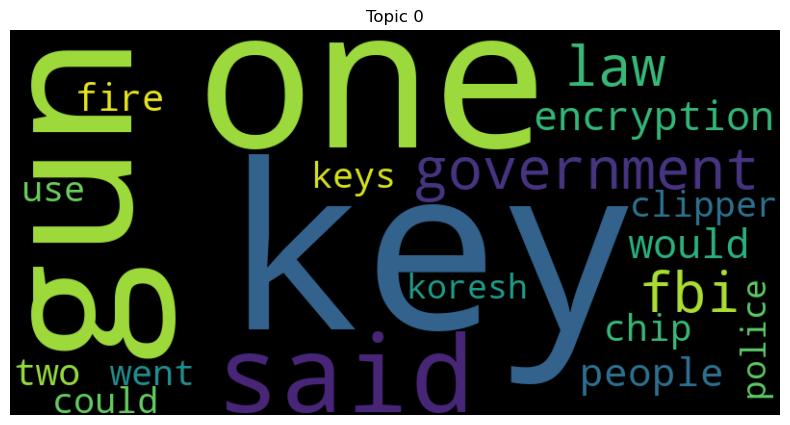

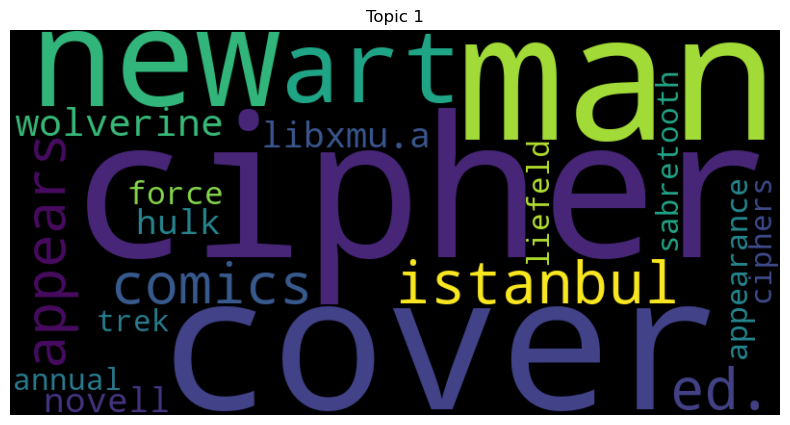

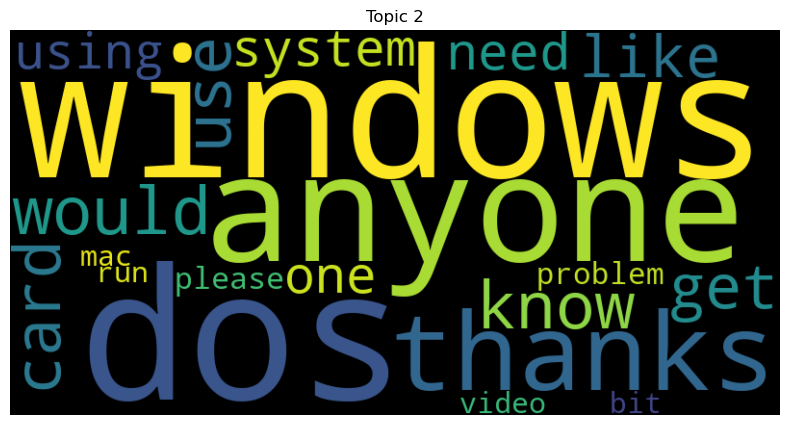

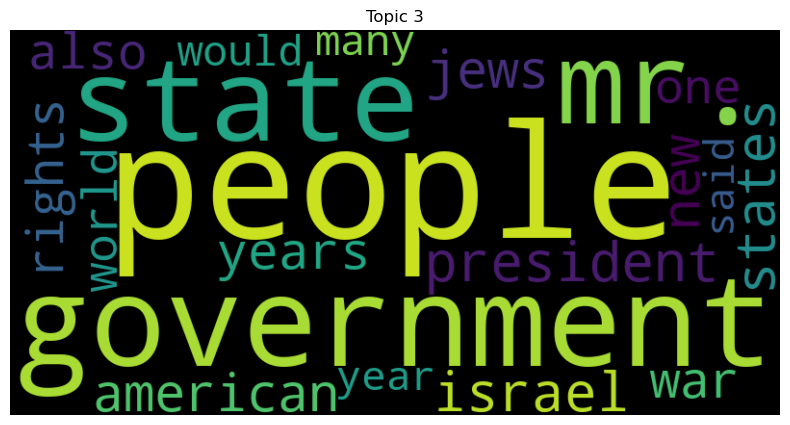

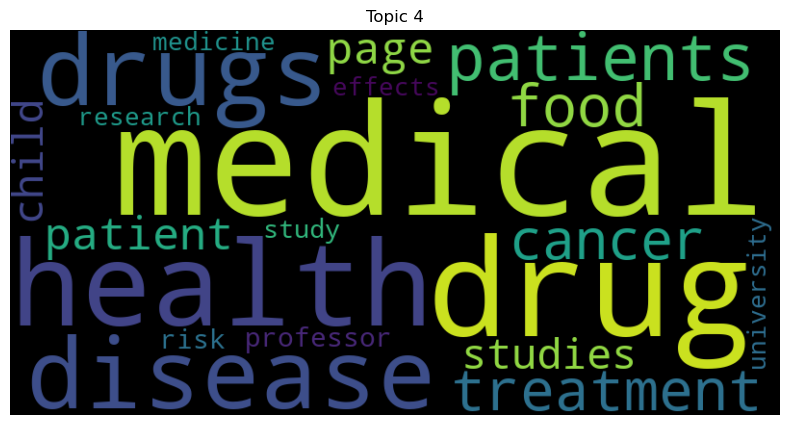

...

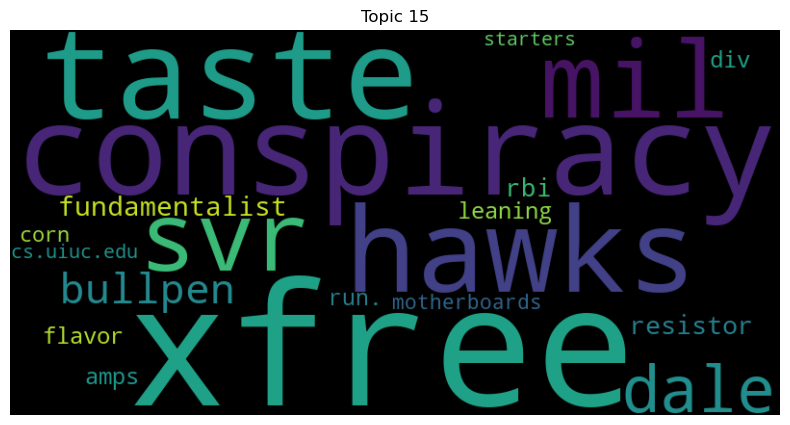

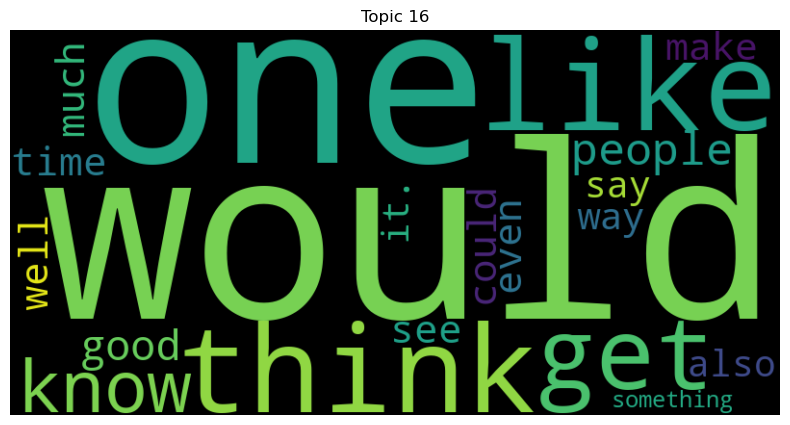

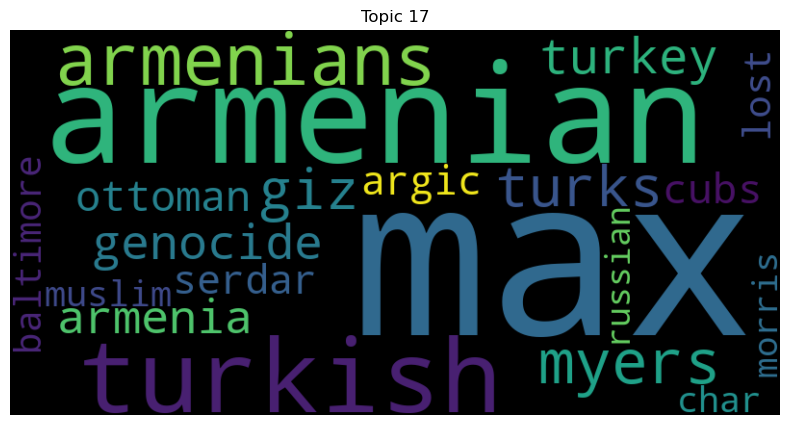

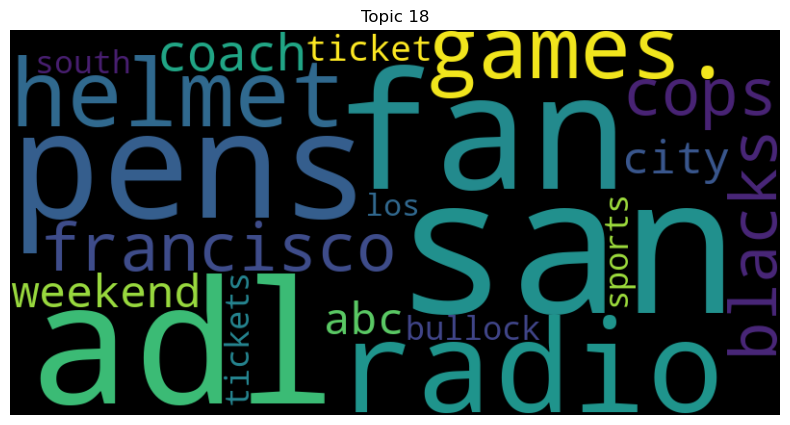

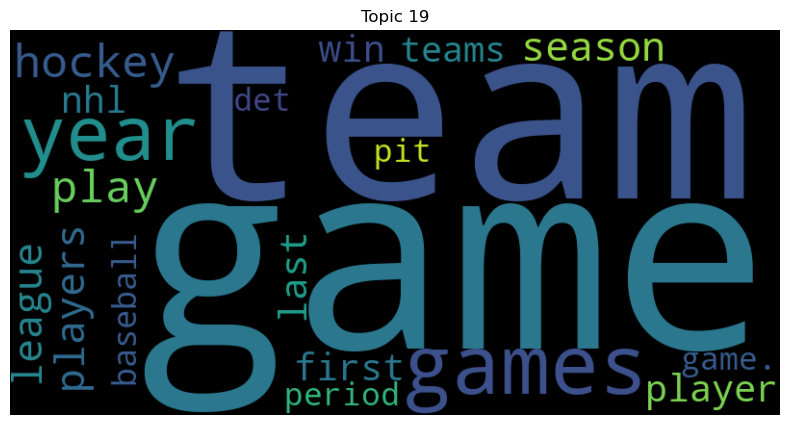

===== LDA model with 50 topics =====


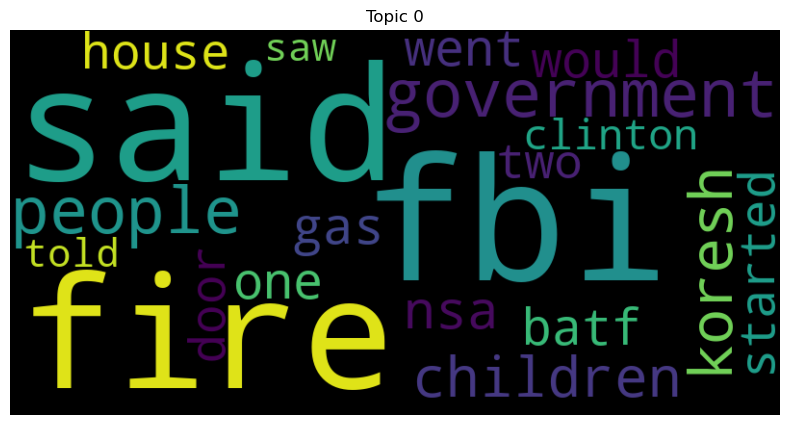

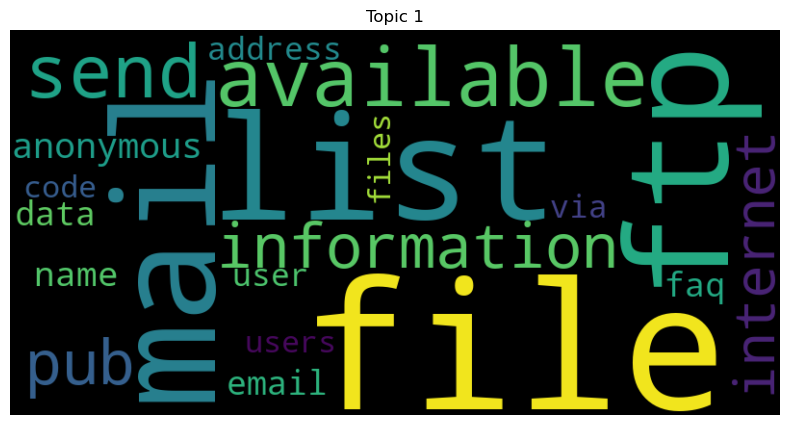

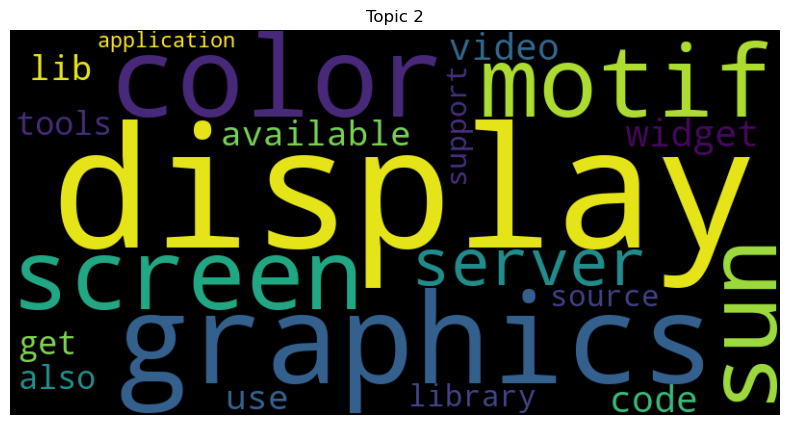

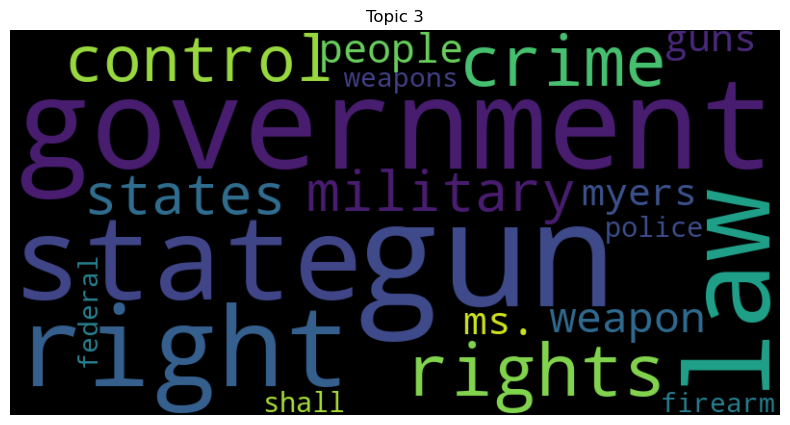

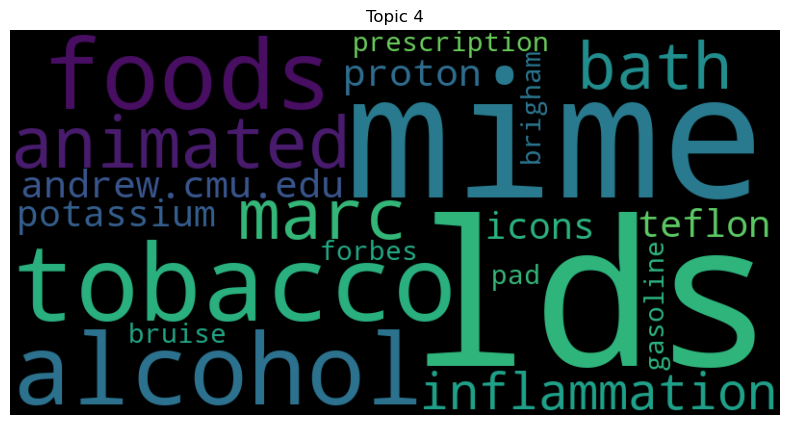

...

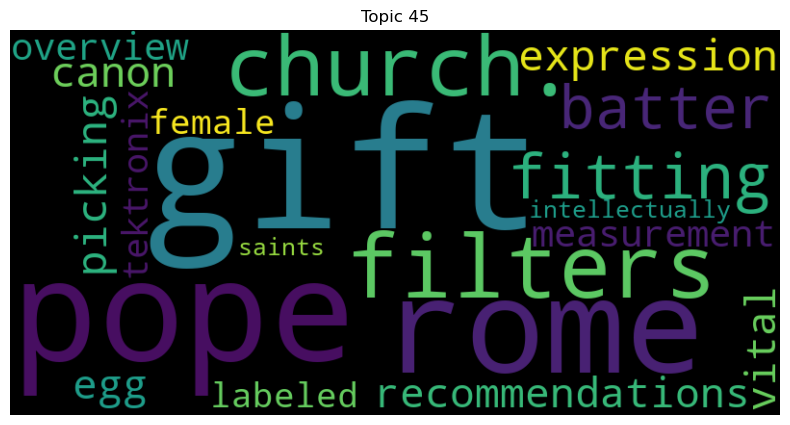

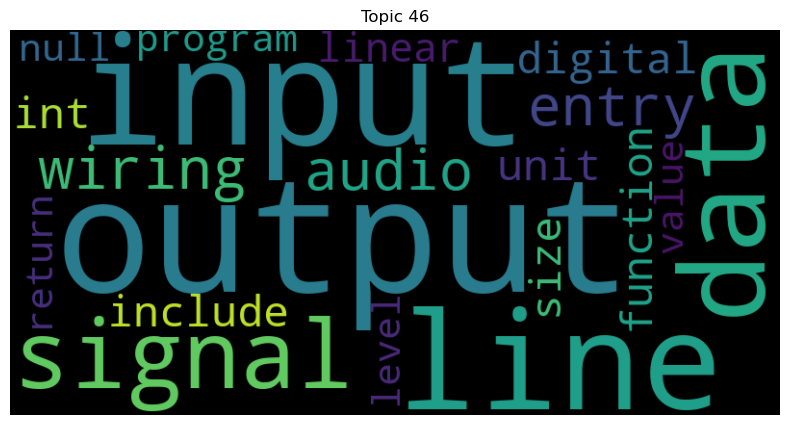

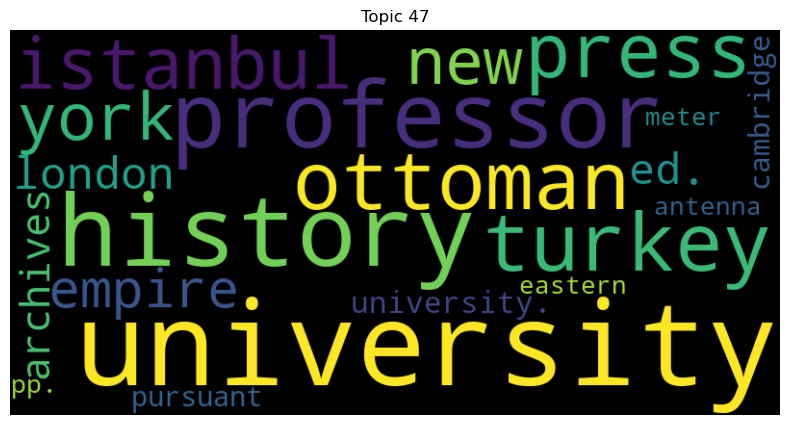

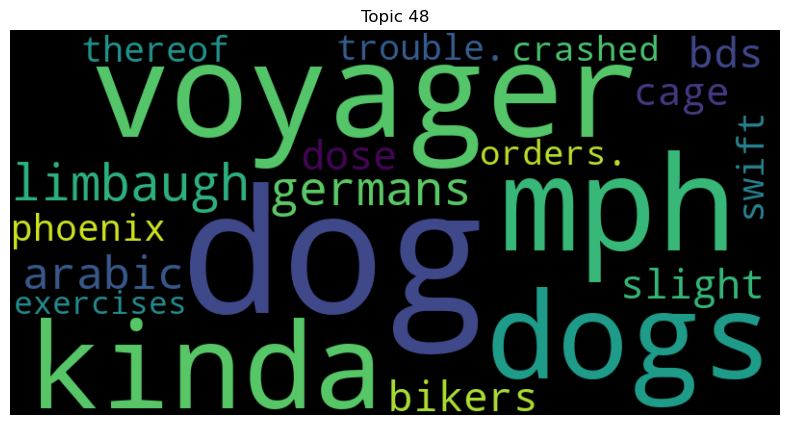

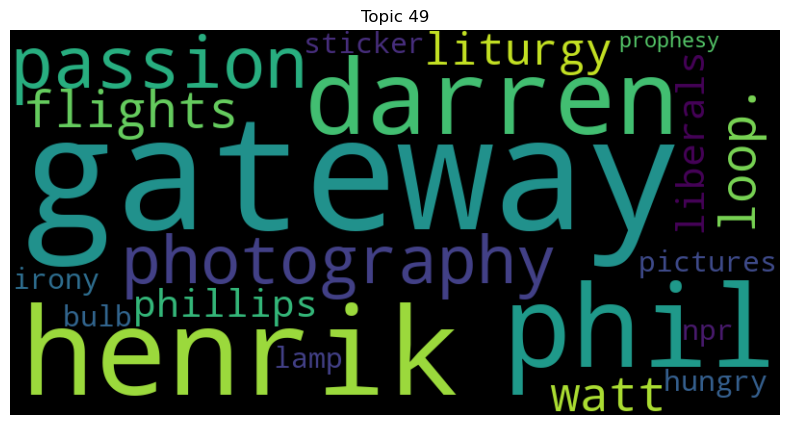

In [13]:
for model  in lda_models:
    print("===== LDA model with {} topics =====".format(model.num_topics))
    for topic_id, topic_words in model.show_topics(num_topics=model.num_topics, num_words=20, formatted=False):
        # For each topic, visualize the word cloud        
        visualize_topic_wordcloud(topic_words, topic_id)

## PROBLEM 2: Extractive Summarization

In [11]:
nltk.download('punkt') # for tokenization

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\fred9\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt_tab.zip.


True

In [30]:
from nltk.tokenize import sent_tokenize, word_tokenize
from collections import Counter

from nltk.tokenize import sent_tokenize, word_tokenize
from collections import Counter
import numpy as np

def kl_sum(document, K=3):
    """
    Summarize a document using KL-Sum: Greedily select K sentences whose 
    word distribution is closest (lowest KL divergence) to the full document.
    """
    # Step 1: Split document into sentences
    sentences = sent_tokenize(document)
    
    # Step 2: Preprocess each sentence and count words
    sentence_counters = []
    for sentence in sentences:
        words = preprocess_text(sentence.strip())  # custom tokenization/lowercasing
        sentence_counters.append(Counter(words))

    # Step 3: Build the document-wide word distribution P_D
    total_counter = sum(sentence_counters, Counter())  # total word counts over all sentences
    total_words = sum(total_counter.values())
    if total_words == 0:
        return []  # Edge case: empty document
    P_D = {w: count / total_words for w, count in total_counter.items()}

    # Step 4: Greedily select K sentences that best approximate P_D
    selected_indices = []
    for _ in range(K):
        best_kl = float('inf')
        best_index = -1
        
        for i in range(len(sentences)):
            if i in selected_indices:
                continue  # skip already-selected sentences

            # Temporarily add this sentence and compute new summary distribution P_S
            temp_indices = selected_indices + [i]
            temp_counter = sum([sentence_counters[j] for j in temp_indices], Counter())
            temp_total_words = sum(temp_counter.values())
            if temp_total_words == 0:
                continue  # skip if empty
            P_S = {w: count / temp_total_words for w, count in temp_counter.items()}

            # Compute KL divergence D_KL(P_S || P_D)
            kl = sum(P_S[w] * np.log(P_S[w] / P_D[w]) for w in P_S)
            if kl < best_kl:
                best_kl = kl
                best_index = i

        # Add best sentence to the summary
        if best_index != -1:
            selected_indices.append(best_index)
        else:
            break  # no suitable sentence left

    # Step 5: Return selected sentences in order
    summary = [sentences[i] for i in selected_indices]
    return summary


# Apply to the entire corpus
def summarize_corpus(fids, corpus, K=3):
    """
    Apply KL-Sum summarization to each document in the corpus.
    
    Args:
        fids: list of document IDs
        corpus: list of document strings
        K: number of sentences to include per summary
    
    Returns:
        dict: mapping from fid to list of selected summary sentences
    """
    summaries = {}
    for fid, document in zip(fids, corpus):
        summary = kl_sum(document, K)
        summaries[fid] = summary
    return summaries


In [39]:
# Get topic distribution for a text (document or summary)
def get_topic_distribution(lda_model, dictionary, text):
    """
    Infer topic distribution for a given text using the pre-trained LDA model.
    
    Args:
        lda_model (LdaModel): Pre-trained LDA model.
        dictionary (corpora.Dictionary): Dictionary from training.
        text (str): Text to infer topics for.
    
    Returns:
        np.array: Topic distribution vector of length num_topics.
    """
    tokenized_text = [word for word in preprocess_text(text)]
    bow = dictionary.doc2bow(tokenized_text)
    topic_dist = lda_model[bow]  # List of (topic_id, probability)
    
    # Convert to full vector
    num_topics = lda_model.num_topics
    dist_vector = np.zeros(num_topics)
    for topic_id, prob in topic_dist:
        dist_vector[topic_id] = prob
    # Normalize to ensure it sums to 1 (handle cases with low total probability)
    total = sum(dist_vector)
    if total > 0:
        dist_vector /= total
    else:
        dist_vector = np.ones(num_topics) / num_topics  # Uniform if no topics
    return dist_vector

# Topic-based KL-Sum for a single document
def kl_sum_topic_based(lda_model, document, dictionary, K=3):
    """
    Implement topic-based KL-Sum summarization for a single document.
    
    Args:
        document (str): Input document as a string.
        lda_model (LdaModel): Pre-trained LDA model.
        dictionary (corpora.Dictionary): Dictionary from training.
        K (int): Number of sentences in summary (default=3).
    
    Returns:
        list: Selected sentences forming the summary.
    """
    # Split document into sentences
    sentences = sent_tokenize(document)
    if len(sentences) < 1:
        return []
    if len(sentences) < K:
        return sentences
    
    # Get document topic distribution (P_D)
    P_D = get_topic_distribution(lda_model, dictionary, document)
    
    # Greedily select K sentences
    selected_indices = []
    current_summary = ""
    
    for _ in range(min(K, len(sentences))):
        best_kl = float('inf')
        best_index = -1
        
        # Try each unselected sentence
        for i in range(len(sentences)):
            if i in selected_indices:
                continue
            # Hypothetical summary with this sentence
            temp_summary = current_summary + " " + sentences[i]
            P_S = get_topic_distribution(lda_model, dictionary, temp_summary)
            
            # Compute KL divergence: D_KL(P_S || P_D)
            kl = sum(p_s * np.log(p_s / (p_d + 1e-12)) if p_s > 0 else 0 
                     for p_s, p_d in zip(P_S, P_D))
            if kl < best_kl:
                best_kl = kl
                best_index = i
        
        if best_index != -1:
            selected_indices.append(best_index)
            current_summary += " " + sentences[best_index]
        else:
            break
    
    # Compile summary
    summary = [sentences[i] for i in selected_indices]
    return summary

# Apply to the entire corpus
def summarize_corpus_topic_based(lda_model, fids, dictionary, corpus, K=3):
    """
    Summarize each document in the corpus using topic-based KL-Sum.
    
    Args:
        fids (list): List of document IDs.
        corpus (list): List of document strings [c1, c2, ..., cn].
        K (int): Number of sentences per summary (default=3).
    
    Returns:
        dict: Summaries keyed by fid.
    """
    
    # Summarize each document
    summaries = {}
    for fid, doc in zip(fids, corpus):
        summary = kl_sum_topic_based(lda_model, doc, dictionary, K)
        summaries[fid] = summary
    return summaries

In [66]:
gold_summaries = {fid: " ".join(preprocess_text(doc['Abstract'])) for fid, doc in duc_dict.items()}
corpus_duc = [" ".join(preprocess_text(doc['Introduction'])) for doc in duc_dict.values()]
fids = duc_dict.keys()
#generate word based summaries
wordbased_summaries = summarize_corpus(fids, corpus_duc)
#generate topic based summaries, using 10 topics, less performs better (from experiments)
topicbased_summaries = summarize_corpus_topic_based(duc_lda_models[0], duc_dict.keys(), duc_intro_dictionary, corpus_duc)

In [41]:
from rouge_score import rouge_scorer

In [67]:
scorer = rouge_scorer.RougeScorer(['rouge1','rouge2', 'rougeL'], use_stemmer=True)
wordbased_scores = {}
topicbased_scores = {}
for fid in fids:
    wordbased_scores[fid] = scorer.score(" ".join(wordbased_summaries[fid]),gold_summaries[fid])
    topicbased_scores[fid] = scorer.score(" ".join(topicbased_summaries[fid]),gold_summaries[fid])

In [68]:
def append_scores(scores_dict, metrics):
    for scores in scores_dict.values():
        metrics['r1'].append((scores['rouge1'].precision, scores['rouge1'].recall, scores['rouge1'].fmeasure))
        metrics['r2'].append((scores['rouge2'].precision, scores['rouge2'].recall, scores['rouge2'].fmeasure))
        metrics['rL'].append((scores['rougeL'].precision, scores['rougeL'].recall, scores['rougeL'].fmeasure))

def print_average_scores(metric_name, scores):
    precision, recall, f1 = np.mean(scores, axis=0)
    print(f"Average {metric_name} Precision: {precision:.4f} Recall: {recall:.4f} F1 Score: {f1:.4f}")

# Topic-based scores
topic_metrics = {'r1': [], 'r2': [], 'rL': []}
append_scores(topicbased_scores, topic_metrics)

print("=== Topic-based KL-Sum Summarization Rouge Scores ===")
print_average_scores("Rouge-1", topic_metrics['r1'])
print_average_scores("Rouge-2", topic_metrics['r2'])
print_average_scores("Rouge-L", topic_metrics['rL'])

# Word-based scores
word_metrics = {'r1': [], 'r2': [], 'rL': []}
append_scores(wordbased_scores, word_metrics)

print("=== Word-based KL-Sum Summarization Rouge Scores ===")
print_average_scores("Rouge-1", word_metrics['r1'])
print_average_scores("Rouge-2", word_metrics['r2'])
print_average_scores("Rouge-L", word_metrics['rL'])

=== Topic-based KL-Sum Summarization Rouge Scores ===
Average Rouge-1 Precision: 0.2846 Recall: 0.3536 F1 Score: 0.3090
Average Rouge-2 Precision: 0.1354 Recall: 0.1650 F1 Score: 0.1459
Average Rouge-L Precision: 0.2038 Recall: 0.2545 F1 Score: 0.2218
=== Word-based KL-Sum Summarization Rouge Scores ===
Average Rouge-1 Precision: 0.3805 Recall: 0.3115 F1 Score: 0.3369
Average Rouge-2 Precision: 0.1631 Recall: 0.1357 F1 Score: 0.1460
Average Rouge-L Precision: 0.2449 Recall: 0.2009 F1 Score: 0.2171


In [65]:
#50 topics
topicbased_summaries = summarize_corpus_topic_based(duc_lda_models[3], duc_dict.keys(), duc_intro_dictionary, corpus_duc)
topicbased_scores = {}
for fid in fids:
    topicbased_scores[fid] = scorer.score(" ".join(topicbased_summaries[fid]),gold_summaries[fid])
topic_metrics = {'r1': [], 'r2': [], 'rL': []}
append_scores(topicbased_scores, topic_metrics)

print("=== Topic-based KL-Sum Summarization Rouge Scores ===")
print_average_scores("Rouge-1", topic_metrics['r1'])
print_average_scores("Rouge-2", topic_metrics['r2'])
print_average_scores("Rouge-L", topic_metrics['rL'])

=== Topic-based KL-Sum Summarization Rouge Scores ===
Average Rouge-1 Precision: 0.2517 Recall: 0.3332 F1 Score: 0.2792
Average Rouge-2 Precision: 0.1057 Recall: 0.1386 F1 Score: 0.1167
Average Rouge-L Precision: 0.1757 Recall: 0.2345 F1 Score: 0.1954
